# IT326 Project - Phase3

In this phase, we’ll use data mining techniques—classification and clustering—to analyze our dataset. Classification will categorize data into predefined labels, allowing us to predict classes for new instances, while clustering will group similar data points based on shared characteristics.

### Importing Required Libraries:

In [68]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn import tree, metrics
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples,silhouette_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import warnings
from sklearn.metrics import calinski_harabasz_score
from yellowbrick.cluster import SilhouetteVisualizer

### Loading Data

In [69]:
data = pd.read_csv('Processed_dataset.csv')
# Display the first few rows of the data
display(data.head())

,discretized_Age,no_lasting_investmen,education_level,total_assets,Married,depressed
0,1,0.735517,0.647059,0.559892,1,1
1,0,0.291477,0.352941,0.291340,0,1
2,1,0.301352,0.176471,0.505481,1,1
3,1,0.291477,0.647059,0.291340,1,1
4,0,0.291477,0.470588,0.291340,1,1


# Classification

We will perform a comprehensive evaluation of Decision Tree classification on our dataset, using three distinct training-test partition sizes. This approach ensures a robust assessment of the model's reliability and generalizability, supporting confident decision-making for model selection.


### Feature Selection

We used feature selection to focus on the most relevant attributes for predicting "depressed" status. This reduces noise and improves model accuracy and efficiency by highlighting the features that most influence whether a person is classified as depressed or not.

In [70]:
fn = data.keys().tolist() [:-1]
X = data[fn]
y = data['depressed']

### Splitting data

Splitting data into three different test sizes:

60-40:
  - Training (60%)

  - Test (40%)
  
70-30:
  - Training (70%)

  - Test (30%)

80-20:
  - Training (80%)

  - Test (20%)


In [71]:
# 60% training and 40% testing
X_train_60, X_test_40, Y_train_60, Y_test_40 = train_test_split(X, y, test_size=0.4, random_state=1)

# 70% training and 30% testing
X_train_70, X_test_30, Y_train_70, Y_test_30 = train_test_split(X, y, test_size=0.3, random_state=1)

# 80% training and 20% testing
X_train_80, X_test_20, Y_train_80, Y_test_20 = train_test_split(X, y, test_size=0.2, random_state=1)

### Building desicion tree model:

For each partition, we will test two attribute selection measures: Information Gain (using entropy) and the Gini index.

The Gini index, ranging from 0 to 1, measures impurity, with 0 indicating perfect purity (where all data points are of the same class) and 1 representing maximum impurity (equal class distribution). Decision trees use the attribute with the lowest Gini index after a split for branching.

To manage complexity, we will prune the decision trees by setting a maximum depth. This pruning reduces unnecessary branches, simplifying decision boundaries and enhancing interpretability without greatly affecting predictive performance.

#### Information Gain (Entropy)

Entropy is used when building desicion tree models to decide the best splits for our data. In each step, entropy helps measure the impurity of a feature regarding the "depressed" attribute, guiding the model to choose the splits that provide the most information gain. This process helps create a more accurate and efficient tree by focusing on features that best separate depressed and non-depressed cases.

In [72]:
clf_entropy_60 = DecisionTreeClassifier(criterion='entropy', random_state=1)
clf_entropy_60.fit(X_train_60, Y_train_60)

clf_entropy_70 = DecisionTreeClassifier(criterion='entropy', random_state=1)
clf_entropy_70.fit(X_train_70, Y_train_70)

clf_entropy_80 = DecisionTreeClassifier(criterion='entropy', random_state=1)
clf_entropy_80.fit(X_train_80, Y_train_80)

y_pred_entropy_60 = clf_entropy_60.predict(X_test_40)
y_pred_entropy_70 = clf_entropy_70.predict(X_test_30)
y_pred_entropy_80 = clf_entropy_80.predict(X_test_20)

##### Evaluating The Model:

The outputs show the model's accuracy with entropy: 56.4% for 60-40, 62.8% for 70-30, and 52.8% for 80-20. The highest accuracy is achieved with the 70-30 split, suggesting that this configuration performs better for the given dataset. However, the overall accuracy is moderate, indicating room for improvement in predicting the "depressed" attribute.

In [73]:
accuracy_entropy_60 = metrics.accuracy_score(Y_test_40, y_pred_entropy_60)
print("Accuracy (Entropy - 60-40):", accuracy_entropy_60)

accuracy_entropy_70 = metrics.accuracy_score(Y_test_30, y_pred_entropy_70)
print("Accuracy (Entropy - 70-30):", accuracy_entropy_70)

accuracy_entropy_80 = metrics.accuracy_score(Y_test_20, y_pred_entropy_80)
print("Accuracy (Entropy - 80-20):", accuracy_entropy_80)

Accuracy (Entropy - 60-40): 0.5639810426540285
Accuracy (Entropy - 70-30): 0.6289308176100629
Accuracy (Entropy - 80-20): 0.5283018867924528


#####Entropy Confusion Matrix

Based on the confusion matrices and accuracy results:

1. **60-40 Split:**
   - Accuracy: ~56.39%
   - True Negatives: 90
   - True Positives: 29
   - False Negatives: 54
   - False Positives: 38
   
   This split demonstrates a moderate balance but still has a notable number of false negatives, which is critical in predicting depression correctly.

2. **70-30 Split:**
   - Accuracy: ~62.83%
   - True Negatives: 75
   - True Positives: 25
   - False Negatives: 34
   - False Positives: 25
   
   This split has the highest accuracy among the three, with a better balance between false positives and false negatives, indicating stronger prediction capability.

3. **80-20 Split:**
   - Accuracy: ~52.83%
   - True Negatives: 43
   - True Positives: 13
   - False Negatives: 28
   - False Positives: 27
   
   This split performs the poorest, with the least correct predictions and a high number of misclassifications.


---


**Conclusion:**
The **70-30 split** yields the highest accuracy, suggesting it is the optimal test size for this dataset. However, there is still significant room for improvement in reducing false negatives, as they are particularly crucial in identifying individuals with depression.

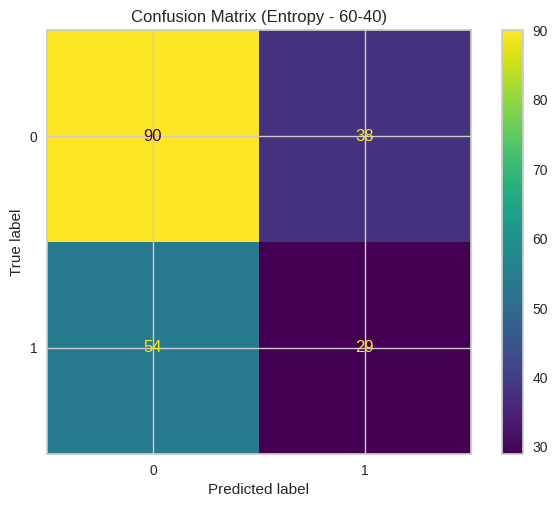

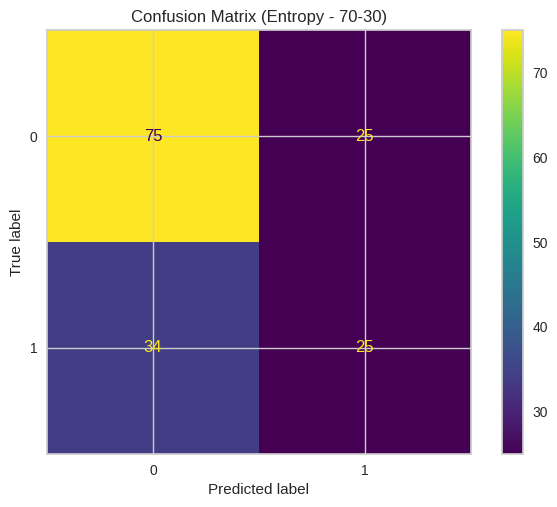

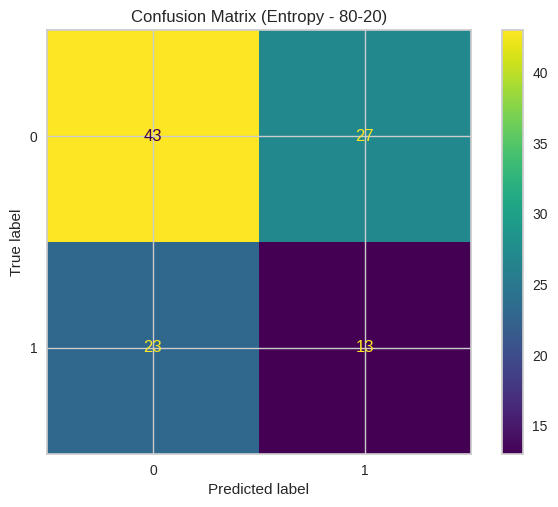

In [74]:
ConfusionMatrixDisplay.from_predictions(Y_test_40, y_pred_entropy_60)
plt.title("Confusion Matrix (Entropy - 60-40)")
plt.show()

ConfusionMatrixDisplay.from_predictions(Y_test_30, y_pred_entropy_70)
plt.title("Confusion Matrix (Entropy - 70-30)")
plt.show()

ConfusionMatrixDisplay.from_predictions(Y_test_20, y_pred_entropy_80)
plt.title("Confusion Matrix (Entropy - 80-20)")
plt.show()

##### Visualizing and Saving Decision Tree

The decision tree visuals illustrate how model structures vary across the 60-40, 70-30, and 80-20 splits using Entropy. The 70-30 split achieves the best accuracy, suggesting it balances training and testing data effectively for this dataset. The trees highlight key features and decision paths, showing how the model classifies "depressed" and "not depressed" cases. This comparison helps identify influential features and reveals how data distribution affects model performance.

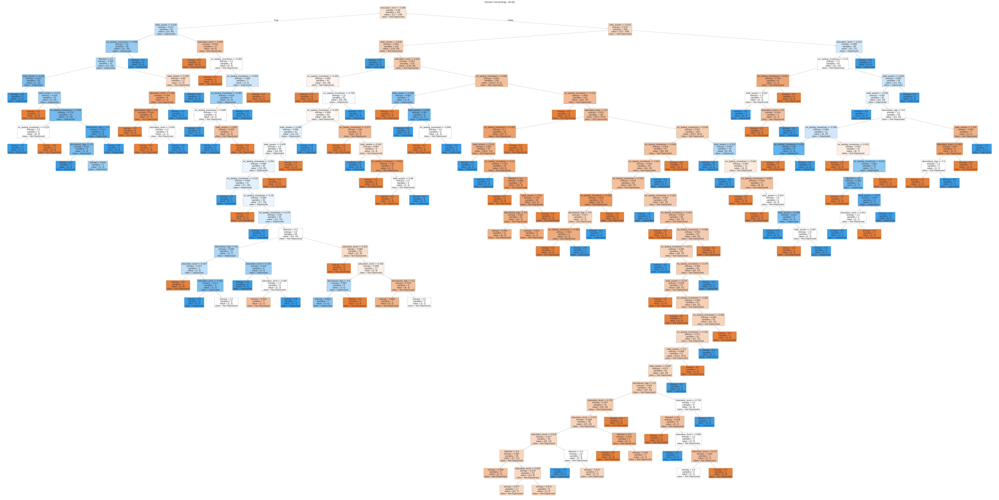

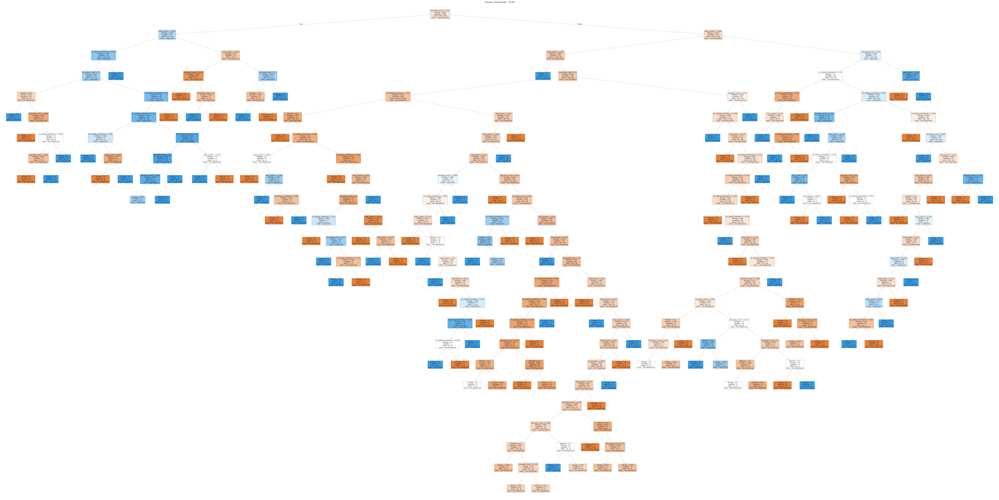

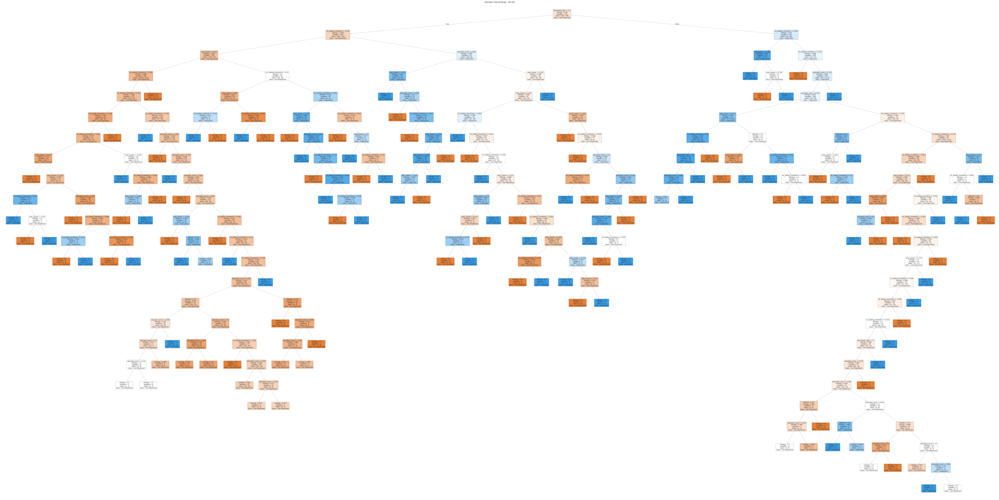

In [75]:
plt.figure(figsize=(100, 50))
plot_tree(clf_entropy_60, filled=True, feature_names=X.columns, class_names=['Not Depressed', 'Depressed'], rounded=True)
plt.title("Decision Tree (Entropy - 60-40)")
plt.show()

plt.figure(figsize=(100, 50))
plot_tree(clf_entropy_70, filled=True, feature_names=X.columns, class_names=['Not Depressed', 'Depressed'], rounded=True)
plt.title("Decision Tree (Entropy - 70-30)")
plt.show()

plt.figure(figsize=(100, 50))
plot_tree(clf_entropy_80, filled=True, feature_names=X.columns, class_names=['Not Depressed', 'Depressed'], rounded=True)
plt.title("Decision Tree (Entropy - 80-20)")
plt.show()

####**Gini**

The Gini index is used when building decision tree models to decide the best splits for the data. At each step, the Gini index measures the impurity of a feature in relation to the "depressed" attribute, guiding the model to choose splits that reduce impurity the most. This process helps create a more accurate and efficient tree by focusing on features that best distinguish between depressed and non-depressed cases.

In [76]:
clf_gini_60 = DecisionTreeClassifier(criterion='gini', random_state=1)
clf_gini_60.fit(X_train_60, Y_train_60)

clf_gini_70 = DecisionTreeClassifier(criterion='gini', random_state=1)
clf_gini_70.fit(X_train_70, Y_train_70)

clf_gini_80 = DecisionTreeClassifier(criterion='gini', random_state=1)
clf_gini_80.fit(X_train_80, Y_train_80)

y_pred_gini_60 = clf_gini_60.predict(X_test_40)
y_pred_gini_70 = clf_gini_70.predict(X_test_30)
y_pred_gini_80 = clf_gini_80.predict(X_test_20)

##### Evaluating the model



The outputs show the model's accuracy using the Gini index: 60.7% for the 60-40 split, 53.5% for the 70-30 split, and 53.8% for the 80-20 split. The highest accuracy is achieved with the 60-40 split, but overall accuracy remains moderate, suggesting room for improvement in predicting the "depressed" attribute.

In [77]:
accuracy_gini_60 = metrics.accuracy_score(Y_test_40, y_pred_gini_60)
print("Accuracy (Gini - 60-40):", accuracy_gini_60)

accuracy_gini_70 = metrics.accuracy_score(Y_test_30, y_pred_gini_70)
print("Accuracy (Gini - 70-30):", accuracy_gini_70)

accuracy_gini_80 = metrics.accuracy_score(Y_test_20, y_pred_gini_80)
print("Accuracy (Gini - 80-20):", accuracy_gini_80)

Accuracy (Gini - 60-40): 0.6066350710900474
Accuracy (Gini - 70-30): 0.5345911949685535
Accuracy (Gini - 80-20): 0.5377358490566038


##### Gini confusion matrix

Based on the confusion matrices and accuracy results:

1. **60-40 Split:**
   - Accuracy: ~60.65%
   - True Negatives: 92  
   - False Positives: 36  
   - False Negatives: 47  
   - True Positives: 36  

   This split provides a balanced performance, with relatively fewer misclassifications compared to the other splits, but it still has a high number of false negatives, which affects the ability to predict depression correctly.

2. **70-30 Split:**
   - Accuracy: ~53.49%  
   - True Negatives: 61  
   - False Positives: 39  
   - False Negatives: 35  
   - True Positives: 24  

   While this split has a lower accuracy compared to the 60-40 split, the balance between false negatives and false positives suggests some potential for reliable predictions.

3. **80-20 Split:**
   - Accuracy: ~53.77%  
   - True Negatives: 43  
   - False Positives: 27  
   - False Negatives: 22  
   - True Positives: 14  

   This split demonstrates the lowest accuracy, with fewer true positives and higher misclassifications, making it less suitable for this model.

---

**Conclusion:**  
The **60-40 split** demonstrates the best balance and highest accuracy, making it the most effective for this dataset. However, the number of false negatives remains significant and needs further improvement to enhance the model's reliability in detecting depression cases.


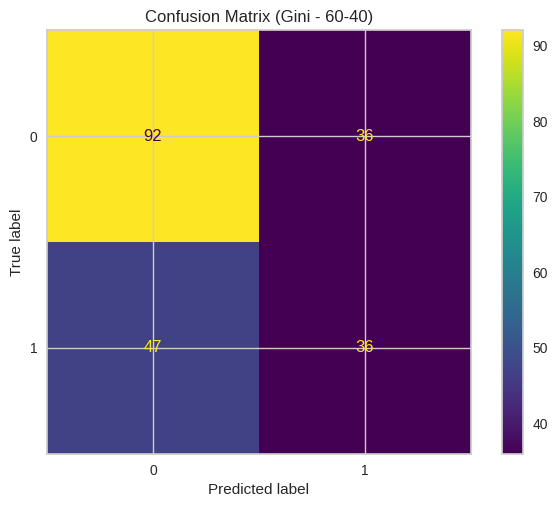

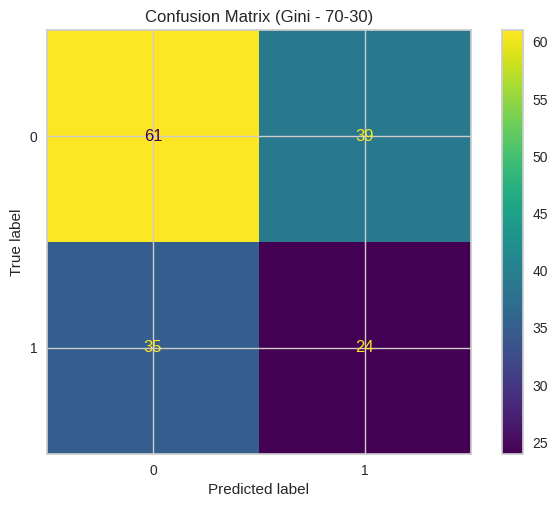

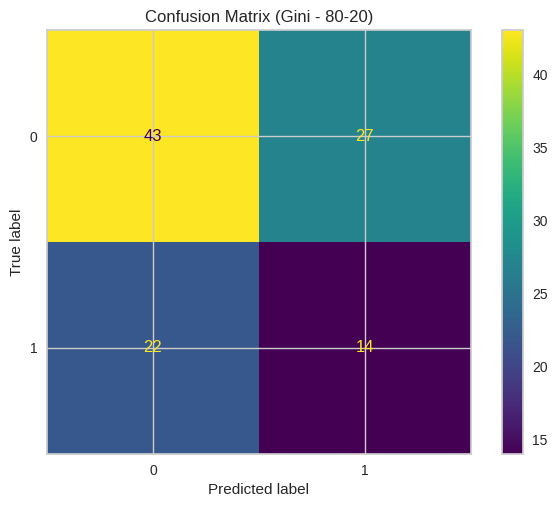

In [78]:
ConfusionMatrixDisplay.from_predictions(Y_test_40, y_pred_gini_60)
plt.title("Confusion Matrix (Gini - 60-40)")
plt.show()

ConfusionMatrixDisplay.from_predictions(Y_test_30, y_pred_gini_70)
plt.title("Confusion Matrix (Gini - 70-30)")
plt.show()

ConfusionMatrixDisplay.from_predictions(Y_test_20, y_pred_gini_80)
plt.title("Confusion Matrix (Gini - 80-20)")
plt.show()

##### visualising and saving the decision tree



The decision tree visuals illustrate how the model’s structure varies across the 60-40, 70-30, and 80-20 splits when using the Gini index. Each tree takes different paths and uses various features to classify "depressed" and "not depressed" cases, influencing the model's accuracy. The 60-40 split provides the best accuracy with this criterion, suggesting it may be the most effective structure for this data. These trees help identify important features and show how the model makes decisions in each split using the Gini index.

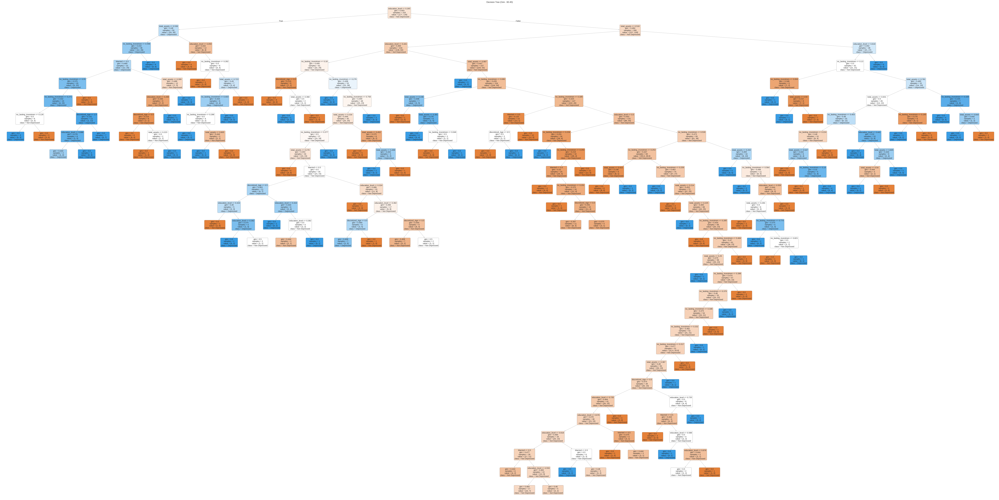

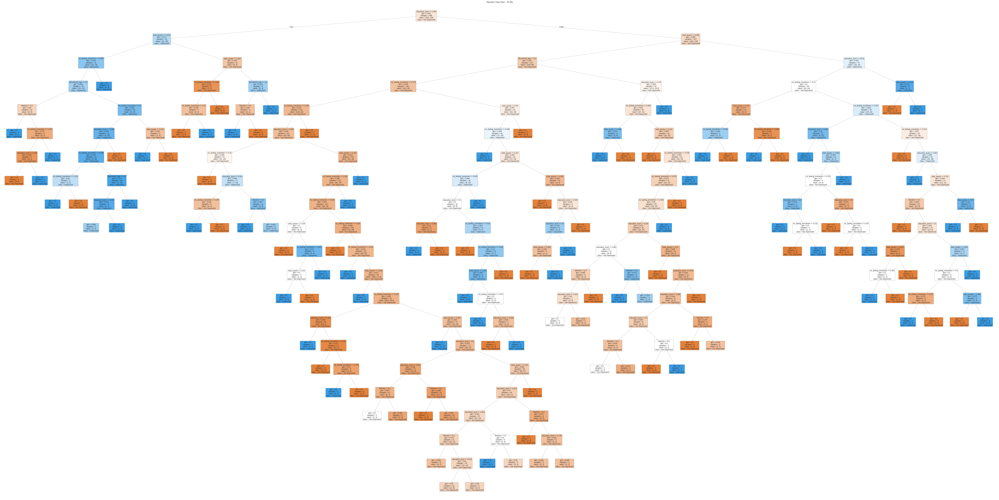

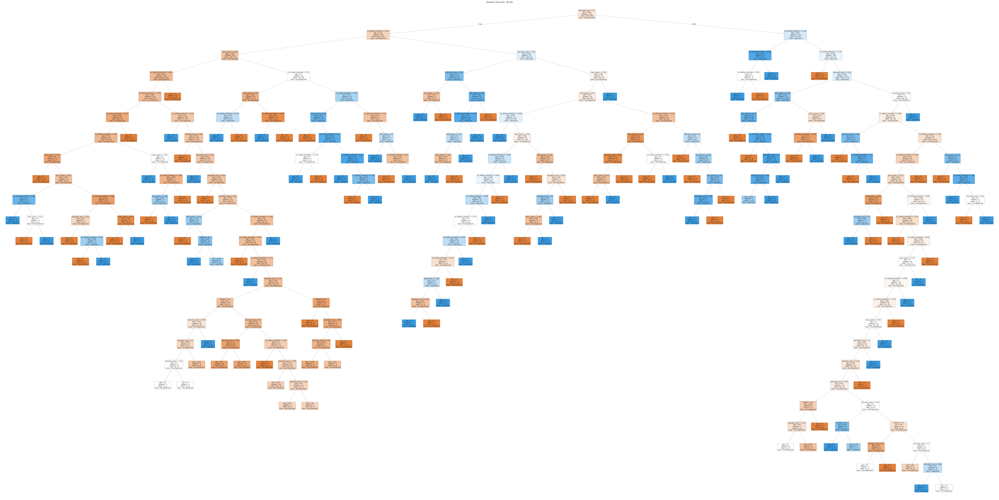

In [79]:
plt.figure(figsize=(100, 50))
plot_tree(clf_gini_60, filled=True, feature_names=X.columns, class_names=['Not Depressed', 'Depressed'], rounded=True)
plt.title("Decision Tree (Gini - 60-40)")
plt.show()

plt.figure(figsize=(100, 50))
plot_tree(clf_gini_70, filled=True, feature_names=X.columns, class_names=['Not Depressed', 'Depressed'], rounded=True)
plt.title("Decision Tree (Gini - 70-30)")
plt.show()

plt.figure(figsize=(100, 50))
plot_tree(clf_gini_80, filled=True, feature_names=X.columns, class_names=['Not Depressed', 'Depressed'], rounded=True)
plt.title("Decision Tree (Gini - 80-20)")
plt.show()

### Results:



- **60-40 Split**:
  - **Entropy**: Accuracy is approximately 56.39%, with moderate balance but a significant number of false negatives, which is critical for predicting depression accurately.
  - **Gini**: Accuracy is around 60.65%, which is the highest accuracy across all splits using Gini. It provides better performance than entropy for this split, though false negatives remain a concern.

- **70-30 Split**:
  - **Entropy**: Accuracy is about 62.83%, the highest among all splits for entropy. This split demonstrates the best balance between false positives and false negatives, making it the strongest performer for entropy.
  - **Gini**: Accuracy is approximately 53.49%, lower than entropy for this split, with higher misclassifications, making it less effective than the 60-40 split for Gini.

- **80-20 Split**:
  - **Entropy**: Accuracy is approximately 52.83%, the lowest among entropy-based splits, with a high number of false negatives and misclassifications.
  - **Gini**: Accuracy is around 53.77%, comparable to entropy but still one of the weakest splits overall, with fewer correct predictions and higher misclassifications.

**Conclusion:**
For **Entropy**, the **70-30 split yields the highest accuracy (62.83%)**, making it the most effective split for this criterion. However, for **Gini**, the **60-40 split is the most suitable** with the highest accuracy (60.65%) and a balanced performance. Therefore, the choice of split depends on the criterion used, but **Entropy with the 70-30 split** and **Gini with the 60-40 split** are the top performers.

# Clustring

###Cluster Validation Using KMeans

KMeans is a clustering algorithm that groups data points into k clusters based on feature similarity. It assigns points to the nearest cluster center, then recalculates centers until clusters stabilize, helping to reveal patterns in the data.

The target column "depressed" (class label) was dropped for clustering. This allows the KMeans algorithm to group data based on feature similarities alone, without using predefined labels, enabling unbiased clustering.

In [80]:
target_column = data.columns[-1]
print(target_column)
# Drop the target column
data_features = data.drop(target_column, axis=1)

depressed


### Scaling

Scaling is important for clustering because features may have different ranges, which can distort distance calculations in algorithms like KMeans. By scaling the data, each feature contributes equally to the clustering process, resulting in more accurate and balanced clusters.

In [81]:
# Use StandardScaler to scale the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(data_features)

# Create a new DataFrame with the scaled features
depression_scaled = pd.DataFrame(scaled_features, columns=data_features.columns)

# Display the scaled DataFrame
print("\nScaled DataFrame:")
display(depression_scaled.head())


Scaled DataFrame:


,discretized_Age,no_lasting_investmen,education_level,total_assets,Married
0,1.166099,1.814734,1.146462,1.088977,0.583924
1,-0.564983,-0.265261,-0.495346,-0.408907,-1.712552
2,1.166099,-0.219004,-1.480432,0.785491,0.583924
3,1.166099,-0.265261,1.146462,-0.408907,0.583924
4,-0.564983,-0.265261,0.161377,-0.408907,0.583924


###K-means Algorithm

The KMeans algorithm identified clusters with distinct centers, representing average feature values for each group. By testing different values of \( k \), we gained insights into natural groupings within the data:

- **\( k = 5 \)**: Broadly segments the dataset into five main groups.
- **\( k = 6 \)**: Adds more detail, identifying six distinct subgroups.
- **\( k = 7 \)**: Provides finer segmentation, capturing subtle variations.

These clusters reveal patterns related to the "depressed" attribute, helping to identify segments with shared characteristics.

#### Clustering Visualisation (K=5)

The KMeans algorithm with \( k = 5 \) created five clusters, each with distinct centers, grouping data points based on similar characteristics. The average silhouette score of 0.3448 indicates moderate separation between clusters, though there is some overlap. The silhouette plot shows that most clusters have positive silhouette scores, suggesting good cohesion within clusters, but some data points near zero or negative values indicate potential overlap between certain clusters.

Cluster Centers:
[[-0.25493856 -0.22704631  0.26429636  1.87983283  0.34399338]
 [-0.3118209  -0.37670019  0.24833446 -0.44385567  0.58392373]
 [ 2.10088298 -0.01404313 -1.8613312   0.14684498 -1.02360958]
 [-0.2807756   1.94456948  0.07316043 -0.09179055  0.5153722 ]
 [ 0.10821543 -0.21185274  0.08475928 -0.16495107 -1.71255243]]

Cluster Labels:
[3 4 2 1 1 0 4 3 1 4 1 1 2 1 1 1 0 4 0 3 4 2 0 0 0 1 1 2 3 4 4 0 1 4 1 1 1
 2 1 1 2 1 2 0 0 1 4 0 3 1 1 1 0 1 3 0 3 1 4 0 2 1 2 2 3 1 1 1 1 3 2 0 4 3
 4 1 0 0 2 1 1 1 1 1 2 2 3 4 2 2 1 4 3 3 3 1 1 4 1 0 1 4 1 1 2 1 3 4 3 2 4
 1 0 3 4 3 1 1 1 4 1 1 0 0 3 0 2 2 3 3 1 1 4 1 1 3 1 4 3 4 1 2 1 1 4 4 0 1
 0 4 1 3 1 1 4 3 2 1 0 1 4 1 3 2 0 4 3 2 4 1 1 1 2 1 3 0 2 4 1 4 1 2 1 3 3
 1 0 3 1 4 0 1 1 4 3 1 1 0 1 1 1 1 3 1 0 1 4 4 1 2 2 0 3 1 0 1 3 3 1 4 1 2
 1 1 1 2 1 1 2 0 4 0 1 1 4 1 0 1 4 1 1 1 2 4 1 1 1 0 1 1 1 2 1 2 1 0 1 4 1
 1 1 4 4 3 1 1 2 3 1 1 1 1 4 1 1 1 1 4 0 4 0 4 1 4 1 4 4 3 1 1 4 1 3 3 1 1
 1 1 0 1 1 1 1 2 1 4 1 1 1 1 1 2 1 1 1 3 2 3 4 0 0

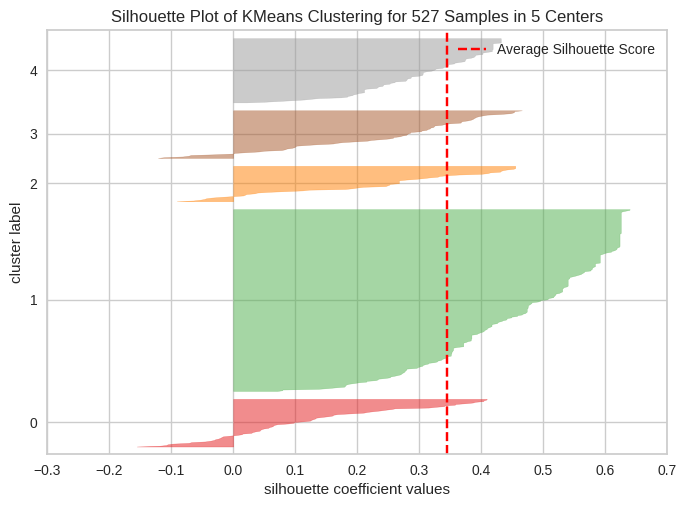

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 527 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [83]:
np. random. seed (42)
# Run k-means clustering with 5 clusters
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans_result = kmeans. fit (depression_scaled)
# Print the clustering result
print("Cluster Centers:")
print (kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print (kmeans_result. labels_)

warnings.filterwarnings("ignore")
#from previous code is kmeans = KMeans(n_clusters=5, random_state=42)
visualizer = SilhouetteVisualizer (kmeans, color="yellowbrick" )
visualizer.fit(depression_scaled) # Fit the data to the visualizer
print("The average silhouette score is:", visualizer.silhouette_score_) # Print the average visualizer.show() # Finalize and render the figure
visualizer.show()

#### Clustering Visualisation (K=6)

With \( k = 6 \), the KMeans algorithm created six clusters, each with its own center. The average silhouette score is 0.3445, indicating moderate separation between clusters. The silhouette plot shows that most clusters are well-defined, though some overlap remains. This clustering provides detailed segmentation, but further adjustments could improve cluster clarity.

Cluster Centers:
[[-0.27646943 -0.228886    0.26585575  1.87275924  0.37515317]
 [-0.30671683 -0.3995355   0.2553838  -0.44393269  0.58392373]
 [ 2.22163649 -0.08559586 -2.08109329  0.24942964 -0.87237822]
 [-0.30051223  1.86202513  0.06104426 -0.11597425  0.52013272]
 [-0.56498307 -0.22886602  0.09687739 -0.18742901 -1.71255243]
 [ 1.28412709 -0.08065007 -0.1222081  -0.11107383 -1.71255243]]

Cluster Labels:
[3 4 2 1 1 0 5 3 1 4 1 1 2 1 1 1 0 5 0 3 5 2 0 0 5 1 1 2 3 5 4 0 1 5 3 1 1
 5 1 1 2 1 5 0 0 1 4 0 3 1 1 1 0 1 3 0 3 1 4 0 2 1 2 2 3 1 1 1 1 3 2 0 5 3
 4 1 0 0 2 1 1 1 1 1 2 2 3 4 2 2 1 5 3 3 3 1 1 4 1 0 1 4 1 1 2 1 3 5 3 2 4
 1 0 3 5 3 1 1 1 5 1 1 0 0 3 0 2 5 3 3 1 1 5 1 1 3 1 5 3 5 1 5 1 1 4 4 0 1
 0 5 1 3 1 1 4 3 2 1 0 1 4 1 3 5 0 4 3 2 4 1 1 1 2 1 3 0 2 4 1 4 1 2 1 3 3
 1 0 3 1 4 0 1 1 4 3 1 3 0 1 1 1 1 3 1 0 1 5 5 1 2 2 0 3 1 0 1 3 3 1 5 1 2
 1 1 1 5 1 1 2 0 5 0 1 1 5 1 0 1 4 1 1 1 2 4 3 1 1 0 1 1 1 2 1 2 1 0 1 5 1
 1 1 5 5 3 1 1 5 3 1 1 1 1 4 1 1 1 1 4 0 5 0 4 1 4 1 4 4 3 1 1

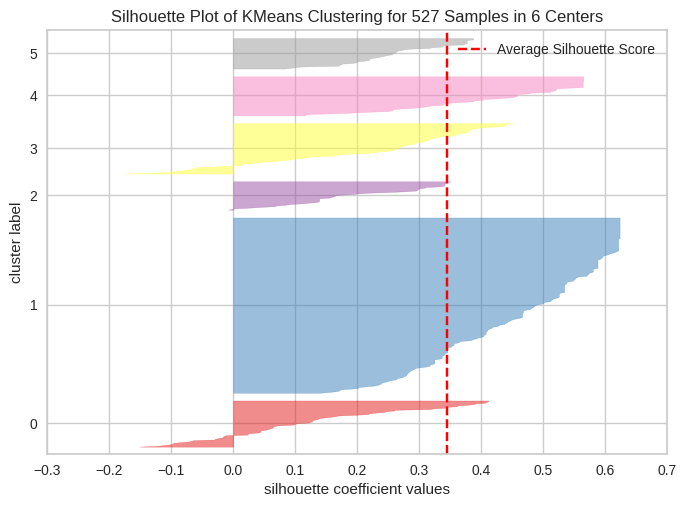

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 527 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [84]:
np. random. seed (42)
# Run k-means clustering with 6 clusters
kmeans = KMeans(n_clusters=6, random_state=42)
kmeans_result = kmeans. fit (depression_scaled)
# Print the clustering result
print("Cluster Centers:")
print (kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print (kmeans_result. labels_)

warnings.filterwarnings("ignore")
#from previous code is kmeans = KMeans(n_clusters=6, random_state=42)
visualizer = SilhouetteVisualizer (kmeans, color="yellowbrick" )
 # Fit the data to the visualizer
visualizer.fit(depression_scaled)
# Print the average visualizer.show() # Finalize and render the figure
print("The average silhouette score is:", visualizer.silhouette_score_)
visualizer.show()

#### Clustering Visualisation (K=7)

With \( k = 7 \), the KMeans algorithm created seven clusters with distinct centers, grouping data points based on similar characteristics. The average silhouette score is 0.43, indicating good separation between clusters. The silhouette plot shows that most data points fit well into their clusters, though some overlap exists between certain groups. This clustering provides a well-defined and balanced segmentation of the data.

Cluster Centers:
[[-2.48024422e-01 -1.40959808e-01  1.75251455e-01  1.86413114e+00
   2.28131648e-01 -1.77635684e-15]
 [-4.58781730e-01 -4.05525804e-01  6.28738473e-01 -4.23052008e-01
   5.83923729e-01  1.00000000e+00]
 [ 1.91225475e+00 -1.37685280e-01 -1.72387219e+00  5.31691912e-02
  -1.19782501e+00  5.00000000e+00]
 [-2.76469429e-01  1.87127860e+00  7.92865825e-02 -5.43434423e-02
   5.20132724e-01  3.00000000e+00]
 [-5.64983070e-01 -2.85651897e-01  2.20482123e-01 -3.32742486e-01
  -1.71255243e+00  2.00000000e+00]
 [ 1.23267885e+00 -1.25214919e-01  3.12928589e-01 -9.40218872e-02
  -1.71255243e+00  1.92307692e+00]
 [-2.77507723e-02 -3.80451467e-01 -4.57603688e-01 -4.99830178e-01
   5.83923729e-01  4.00000000e+00]]

Cluster Labels:
[3 4 2 1 1 0 5 3 1 4 6 6 2 1 6 6 0 2 0 3 5 2 1 0 0 6 1 2 3 5 4 0 1 5 3 1 1
 2 1 6 2 6 2 0 0 6 4 0 3 1 6 6 0 6 3 0 3 1 4 0 2 1 2 2 6 1 1 1 1 3 2 0 5 3
 4 1 0 0 3 1 6 1 1 6 2 2 3 4 2 2 6 5 3 3 3 1 6 4 6 0 1 4 1 1 2 1 3 5 3 2 4
 1 0 3 5 3 1 6 1 5 6 1 0 0 3 0 2 

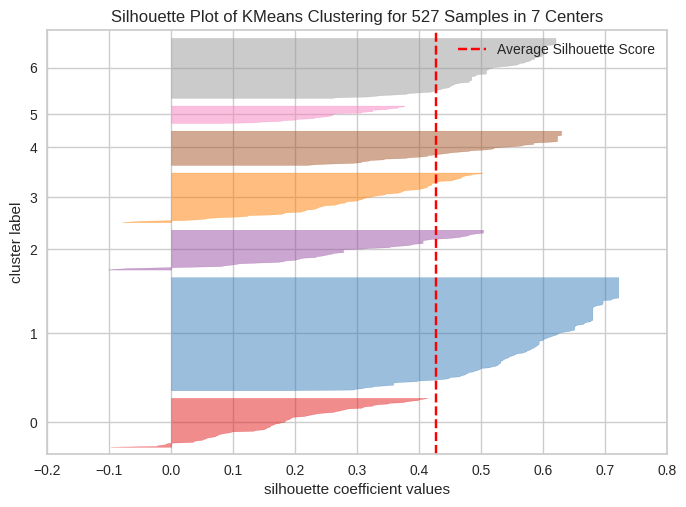

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 527 Samples in 7 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [93]:
np.random.seed(42)
# Run k-means clustering with 7 clusters
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans_result = kmeans. fit (depression_scaled)
# Print the clustering result
print("Cluster Centers:")
print (kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print (kmeans_result. labels_)

warnings.filterwarnings("ignore")
#kmeans = KMeans(n_clusters=7, random_state=42)
visualizer = SilhouetteVisualizer (kmeans, color="YellowBrick" )
visualizer.fit(depression_scaled) # Fit the data to the visualizer
print("The average silhouette score is:", visualizer.silhouette_score_) # Print the average visualizer.show() # Finalize and render the figure
visualizer.show()

### Clustering center Visualisation

These scatter plots show the clustering results for \( k = 5 \), \( k = 6 \), and \( k = 7 \) using KMeans. Each point represents a data sample, with colors indicating cluster membership. The x-axis (total_assets) and y-axis (no_lasting_investment) are the features used for visualization. As \( k \) increases, the data points are divided into more distinct clusters, revealing finer groupings within the data. The choice of \( k \) affects how granularly the data is segmented, with higher \( k \) values providing more detailed clustering.

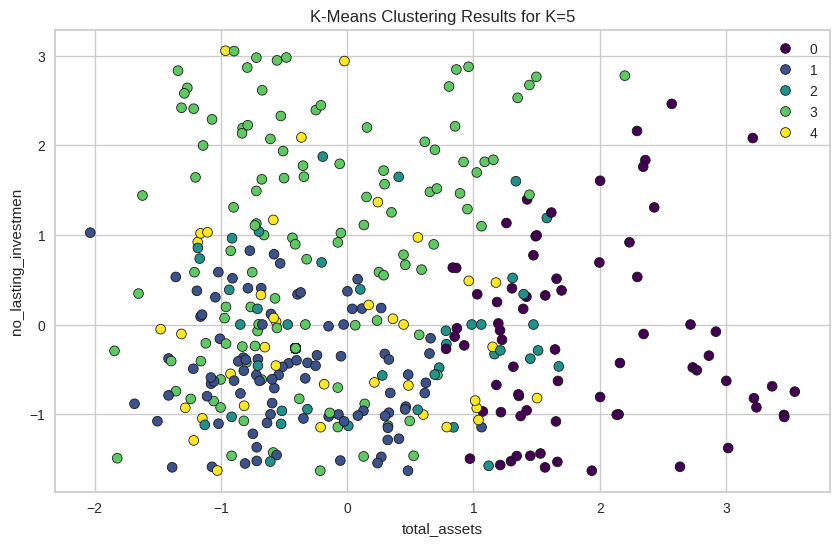

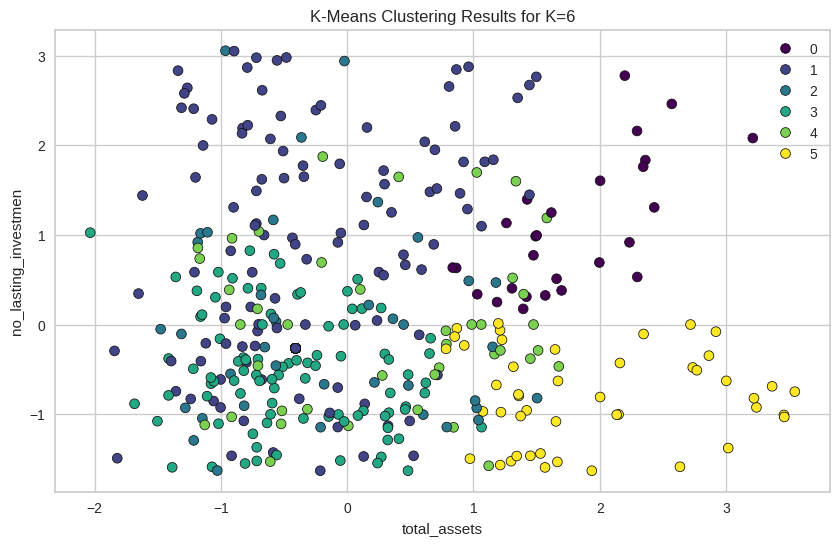

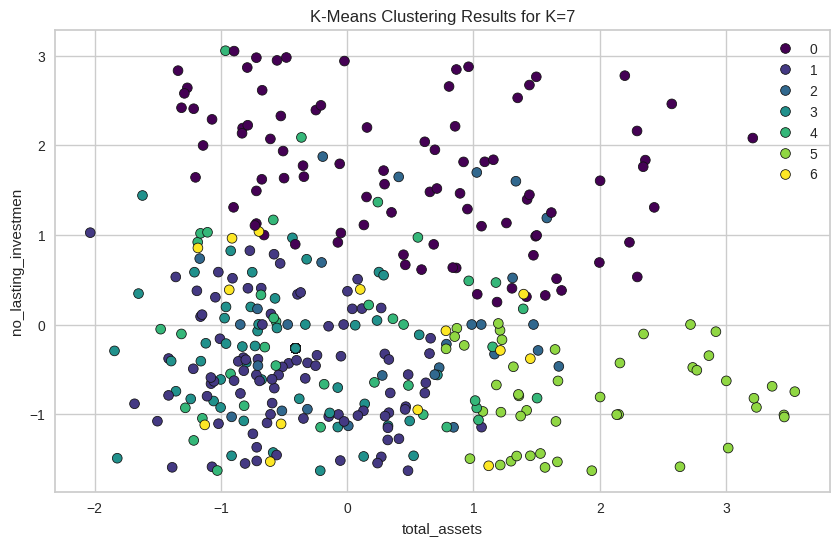

In [94]:
# Values of K to test
k_values = [5, 6, 7]

for k in k_values:
    # Run K-means clustering with K clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans_result = kmeans.fit(depression_scaled)

    # Add cluster labels to the DataFrame
    depression_scaled['Cluster'] = kmeans_result.labels_

    # Visualize clustering using a scatter plot
    plt.figure(figsize=(10, 6))
    sns.scatterplot(
        x=depression_scaled.columns[3],
        y=depression_scaled.columns[1],
        hue='Cluster',
        data=depression_scaled,
        palette='viridis',
        edgecolor='k'
    )
    plt.title(f'K-Means Clustering Results for K={k}')
    plt.xlabel(depression_scaled.columns[3])
    plt.ylabel(depression_scaled.columns[1])
    plt.legend()
    plt.show()

###K-means clustering with estimating K and initiailizations


The graphs evaluate clustering quality for different \(K\):

1. **Calinski-Harabasz Score**: Peaks at \(K = 2\) (~280), indicating compact clusters. Secondary peaks at \(K = 4\) and \(K = 7\), with scores dropping after \(K = 7\).

2. **Silhouette Score**: Peaks at \(K = 7\) (~0.425), showing the best balance of cluster separation and cohesion. Scores decline beyond \(K = 7\).

**Conclusion**: \(K = 7\) is the optimal choice, offering well-separated and cohesive clusters based on both metrics.

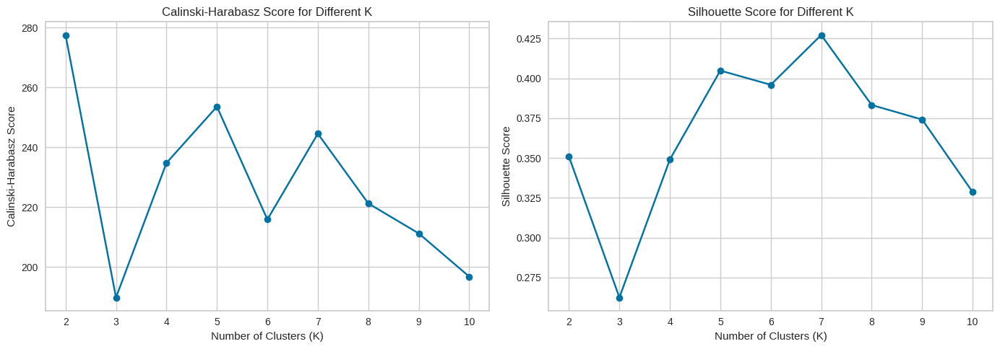

In [86]:
# Range of clusters to try
k_range = range(2, 11)

# Lists to store scores
ch_scores = []
silhouette_scores = []

# Calculate scores for each value of k
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(depression_scaled)
    ch_score = calinski_harabasz_score(depression_scaled, kmeans.labels_)
    silhouette_avg = silhouette_score(depression_scaled, kmeans.labels_)
    ch_scores.append(ch_score)
    silhouette_scores.append(silhouette_avg)

# Plot the scores for comparison
plt.figure(figsize=(14, 5))

# Plot Calinski-Harabasz Score
plt.subplot(1, 2, 1)
plt.plot(k_range, ch_scores, marker='o')
plt.title('Calinski-Harabasz Score for Different K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Calinski-Harabasz Score')

# Plot Silhouette Score
plt.subplot(1, 2, 2)
plt.plot(k_range, silhouette_scores, marker='o')
plt.title('Silhouette Score for Different K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')

plt.tight_layout()
plt.show()

### Clustring validation:

#### Silhouette coefficient

The silhouette score was used here to measure how similar data points are within a cluster compared to other clusters. Higher scores indicate better-defined clusters. Here, KMeans is run for \(K\) values from 2 to 10, and the silhouette score for each value of \(K\) is stored and printed. The highest score is achieved at \(K = 7\) with a value of 0.43.

In [87]:
# Define the range of K values to test
K_range = range(2, 11)

# Dictionary to store results
silhouette_scores = {}
for K in K_range:
    kmeans = KMeans(n_clusters=K, random_state=42)
    clusters = kmeans.fit_predict(depression_scaled)  # This gives the labels directly
    score = silhouette_score(depression_scaled, clusters)  # Pass clusters directly
    silhouette_scores[K] = score
    print(f"Silhouette Score for K={K}: {score:.2f}")

Silhouette Score for K=2: 0.35
Silhouette Score for K=3: 0.26
Silhouette Score for K=4: 0.35
Silhouette Score for K=5: 0.40
Silhouette Score for K=6: 0.40
Silhouette Score for K=7: 0.43
Silhouette Score for K=8: 0.38
Silhouette Score for K=9: 0.37
Silhouette Score for K=10: 0.33


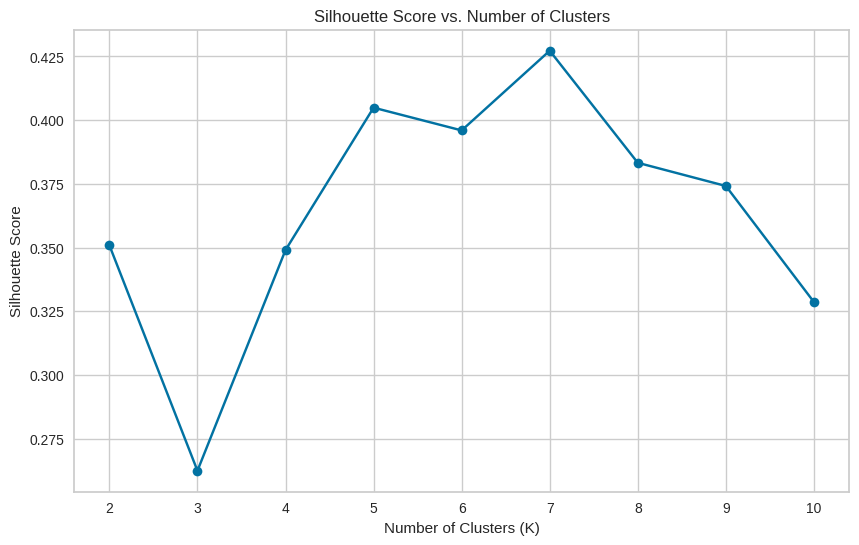

In [88]:
# Plotting the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), marker='o')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. Number of Clusters')
plt.grid(True)
plt.show()

####Elbow method

The first noticeable elbow appears at K=5, indicating a reasonable balance between the number of clusters and clustering quality.
Another elbow is observed at K=7, where the WCSS levels off more significantly, suggesting it as a strong candidate for the optimal number of clusters.
Depending on the dataset and specific needs, both K=5 and K=7 are viable options for the optimal number of clusters.


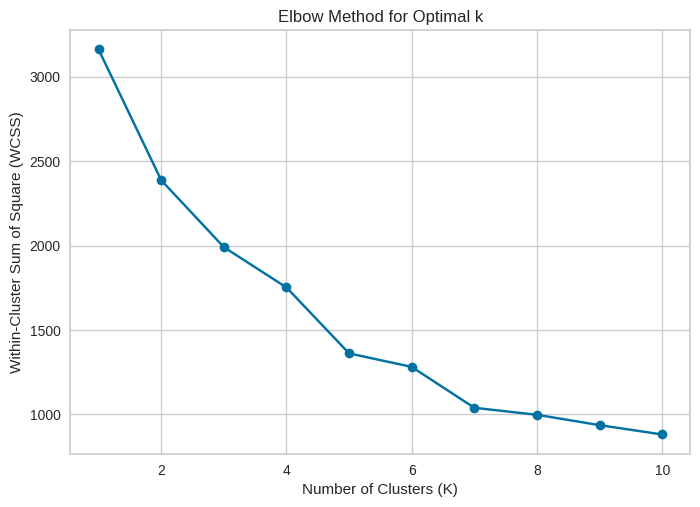

In [91]:
wss_values = []
K_values = range(1, 11)
for k in K_values:
    kmeans = make_pipeline(StandardScaler(), KMeans(n_clusters=k))
    kmeans.fit(depression_scaled)
    wss_values.append(kmeans.named_steps['kmeans'].inertia_)

# Plot the elbow method
plt.plot(K_values, wss_values, marker='o')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Within-Cluster Sum of Square (WCSS)')
plt.title('Elbow Method for Optimal k')
warnings.filterwarnings("ignore")


plt.legend()
plt.show()

### Analysis and Justification:



**Silhouette Score Analysis:** The Silhouette Score, which evaluates how well-separated and cohesive each cluster is, reached its highest value with seven clusters (\(K = 7\)), suggesting that seven clusters provide the best-defined grouping in terms of separation and cohesion.

**Calinski-Harabasz Score Analysis:** The Calinski-Harabasz Score, which measures cluster compactness and separation, peaked at two clusters (\(K = 2\)), showing they form the most compact and well-separated groups. However, seven clusters (\(K = 7\)) also had a high score, indicating it provides similarly good compactness and separation.

**Elbow Method Analysis:** The elbow plot showed a noticeable bend around seven clusters (\(K = 7\)). This suggests that beyond seven clusters, the improvements in clustering quality diminish, making seven clusters a practical choice for balancing compactness and separation.

---

**Conclusion:** Based on the combined analysis, **\(K = 7\)** is the optimal choice as it consistently provides the best-defined clusters across all metrics.